In [12]:
pip install

Package                               Version
------------------------------------- ----------------
absl-py                               1.3.0
aiohttp                               3.8.3
aiosignal                             1.2.0
ansiwrap                              0.8.4
anyio                                 3.6.1
apache-beam                           2.41.0
appdirs                               1.4.4
argon2-cffi                           21.3.0
argon2-cffi-bindings                  21.2.0
asn1crypto                            1.5.1
astunparse                            1.6.3
async-timeout                         4.0.2
asynctest                             0.13.0
attrs                                 22.1.0
Babel                                 2.10.3
backcall                              0.2.0
backports.functools-lru-cache         1.6.4
beatrix-jupyterlab                    2022.1014.175810
beautifulsoup4                        4.11.1
black                                 22.10.0

In [7]:
pip install openpyxl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.1/242.1 kB 11.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:

from wordcloud import WordCloud
import nltk
nltk.download('stopwords')
nltk.download('perluniprops')
nltk.download('nonbreaking_prefixes')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim.models import word2vec
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.graph_objs import *
import tensorflow as tf
import numpy as np


import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D, Dropout, LSTM
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package perluniprops to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package perluniprops is already up-to-date!
[nltk_data] Downloading package nonbreaking_prefixes to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package nonbreaking_prefixes is already up-to-date!


In [3]:

from wordcloud import WordCloud
import nltk
nltk.download('stopwords')
nltk.download('perluniprops')
nltk.download('nonbreaking_prefixes')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim.models import word2vec
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.graph_objs import *
import tensorflow as tf
import numpy as np


import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D, Dropout, LSTM
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package perluniprops to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package perluniprops is already up-to-date!
[nltk_data] Downloading package nonbreaking_prefixes to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package nonbreaking_prefixes is already up-to-date!


In [4]:
import pandas as pd

<AxesSubplot:>

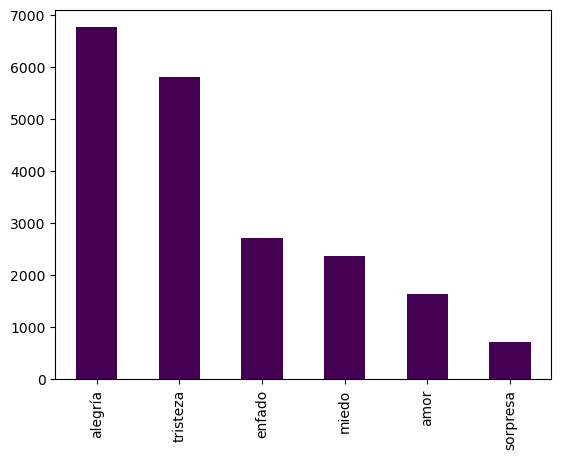

In [5]:
#sentimientosOriginal = pd.read_excel('work/sentimientos.xlsx')
sentimientosOriginal = pd.read_excel('sentimientos.xlsx')
sentimientosOriginal.head(5)
sentimientosOriginal['sentimiento'].value_counts().plot(kind='bar', colormap='viridis')

In [6]:
for col in sentimientosOriginal.columns.values:
    sentimientosOriginal[col] = sentimientosOriginal[col].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8').str.lower()

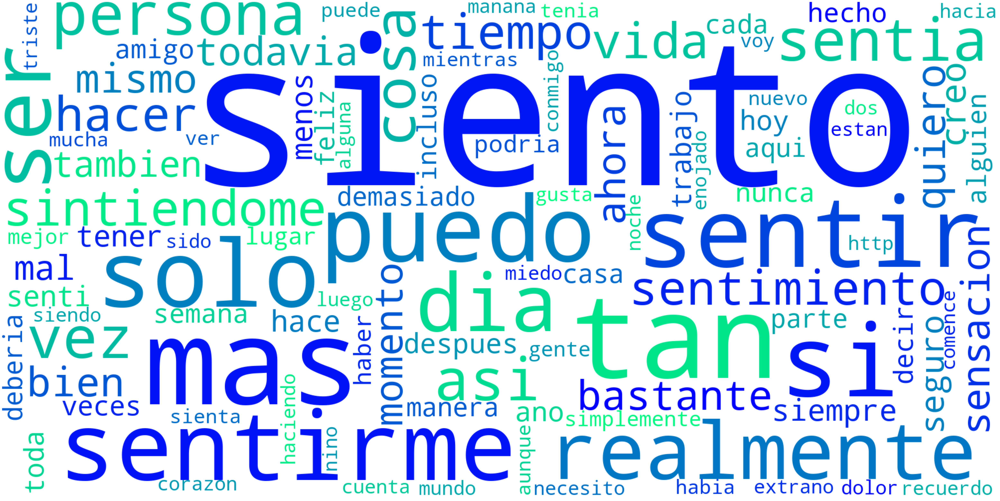

In [7]:


set_stop_words = set(stopwords.words("spanish"))

wordcloud = WordCloud(width=2000,
                      height=1000,
                      max_words=100,
                      normalize_plurals=True,
                      font_step=1,
                      relative_scaling=0.5,
                      collocations=False,
                      stopwords = set_stop_words,
                      background_color="white",
                      colormap='winter',
                      include_numbers=False).generate(" ".join(list(sentimientosOriginal.descripcion)))

plt.figure(figsize = (80, 50), facecolor = None)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()



In [8]:
#codigo de comentarios

In [9]:
def generar_wordcloud(emotion, colormap, data): 
    wordcloud = WordCloud(width=500,
                          height=300,
                          max_words=100,
                          normalize_plurals=True,
                          font_step=1,
                          relative_scaling=0.5,
                          collocations=False,
                          stopwords = set_stop_words,
                          background_color="white",
                          colormap=colormap,
                          include_numbers=False).generate(" ".join(list(data.descripcion)))
    plt.title('Sentimiento: ' + emotion)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

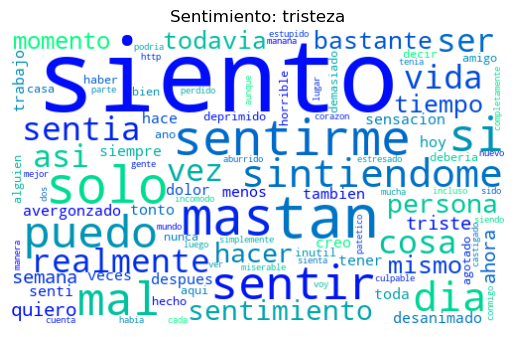

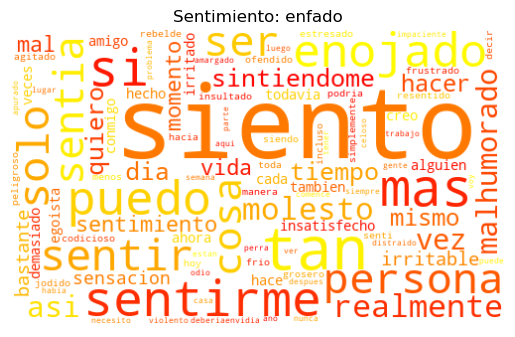

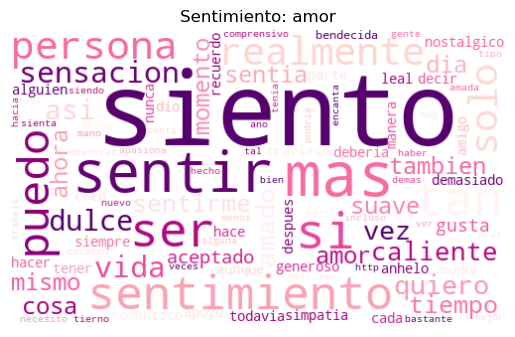

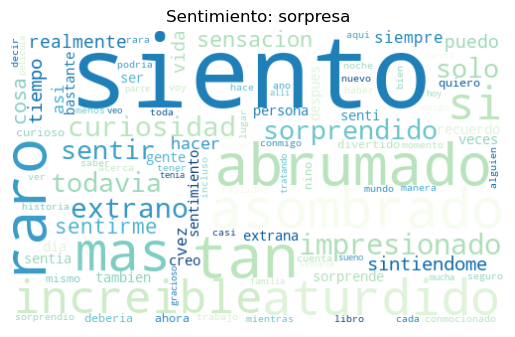

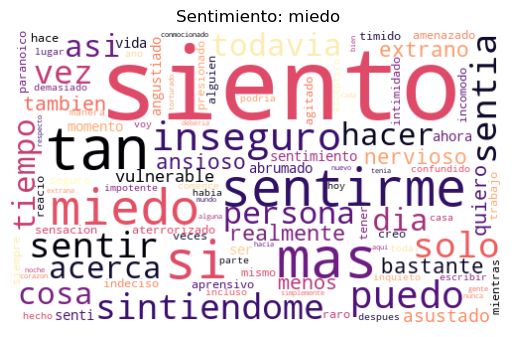

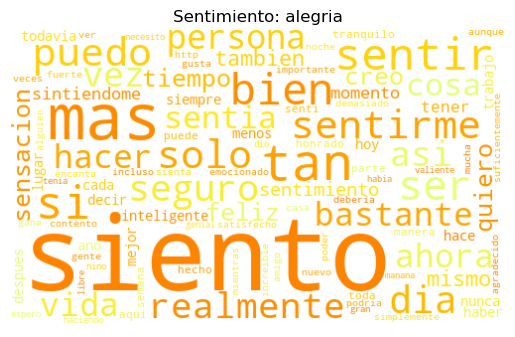

In [10]:
colormaps = {
    'tristeza' : 'winter',
    'enfado' : 'autumn',
    'amor' : 'RdPu',
    'sorpresa' : 'GnBu',
    'miedo' : 'magma',
    'alegria' : 'Wistia'
}

for se in sentimientosOriginal.sentimiento.unique():
    generar_wordcloud(se, colormaps[se], sentimientosOriginal[sentimientosOriginal['sentimiento'] == se])



In [11]:
# from sklearn.model_selection import train_test_split
# entrenamiento,prueba = train_test_split(sentimientosOriginal, , test_size=0.1)
entrenamiento = sentimientosOriginal.iloc[:18000,:]
prueba = sentimientosOriginal.iloc[18000:,:]

In [12]:
print('entrenamiento' + str(entrenamiento.shape))
print('prueba ' + str(prueba.shape))

entrenamiento(18000, 2)
prueba (2000, 2)


In [13]:
# from transformers import pipeline
# # sePipe = pipeline("sentiment-analysis",model="codeswitch-spaeng-sentiment-analysis-lince")
# sePipe = pipeline("sentiment-analysis",model="nlptown/bert-base-multilingual-uncased-sentiment")

In [14]:
# entrenamiento['sent'] = entrenamiento.descripcion.apply(sePipe)
# prueba['sent'] = prueba.descripcion.apply(sePipe)

# entrenamiento

In [15]:
# entrenamiento['sent'] = entrenamiento['sent'].apply(lambda x : x[0]['label'])
# prueba['sent'] = prueba['sent'].apply(lambda x : x[0]['label'])



In [16]:
entrenamiento

,descripcion,sentimiento
0,no me senti humillado,tristeza
1,puedo pasar de sentirme tan desesperado a tene...,tristeza
2,estoy aprovechando un minuto para publicar me ...,enfado
3,siempre me siento nostalgico por la chimenea. ...,amor
4,me siento malhumorado,enfado
...,...,...
17995,sigo sintiendo que alguien no es amable conmig...,enfado
17996,me siento un poco malhumorado negativo despues...,enfado
17997,siento que soy util para mi gente y eso me da ...,alegria
17998,me siento mas comodo con el derby siento que p...,alegria


In [17]:
entrenamiento["descripcion"]

0                                    no me senti humillado
1        puedo pasar de sentirme tan desesperado a tene...
2        estoy aprovechando un minuto para publicar me ...
3        siempre me siento nostalgico por la chimenea. ...
4                                    me siento malhumorado
                               ...                        
17995    sigo sintiendo que alguien no es amable conmig...
17996    me siento un poco malhumorado negativo despues...
17997    siento que soy util para mi gente y eso me da ...
17998    me siento mas comodo con el derby siento que p...
17999    me siento raro cuando tengo que conocer a pers...
Name: descripcion, Length: 18000, dtype: object

In [18]:
entrenamiento["sentimiento"] = entrenamiento["sentimiento"].astype('category')
entrenamiento["sentimiento_label"] = entrenamiento["sentimiento"].cat.codes

prueba["sentimiento"] = prueba["sentimiento"].astype('category')
prueba["sentimiento_label"] = prueba["sentimiento"].cat.codes
entrenamiento.head()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,descripcion,sentimiento,sentimiento_label
0,no me senti humillado,tristeza,5
1,puedo pasar de sentirme tan desesperado a tene...,tristeza,5
2,estoy aprovechando un minuto para publicar me ...,enfado,2
3,siempre me siento nostalgico por la chimenea. ...,amor,1
4,me siento malhumorado,enfado,2


In [19]:
entrenamientoCaracteristica, entrenamientoEtiquetas = entrenamiento['descripcion'], tf.one_hot(
    entrenamiento["sentimiento_label"], 6)
pruebaCaracteristica, pruebaEtiqueta = prueba['descripcion'], tf.one_hot(
    prueba["sentimiento_label"], 6)

2022-11-11 10:10:41.980863: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-11-11 10:10:41.980941: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (inteligencia): /proc/driver/nvidia/version does not exist
2022-11-11 10:10:41.984917: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [20]:
entrenamientoCaracteristica

0                                    no me senti humillado
1        puedo pasar de sentirme tan desesperado a tene...
2        estoy aprovechando un minuto para publicar me ...
3        siempre me siento nostalgico por la chimenea. ...
4                                    me siento malhumorado
                               ...                        
17995    sigo sintiendo que alguien no es amable conmig...
17996    me siento un poco malhumorado negativo despues...
17997    siento que soy util para mi gente y eso me da ...
17998    me siento mas comodo con el derby siento que p...
17999    me siento raro cuando tengo que conocer a pers...
Name: descripcion, Length: 18000, dtype: object

In [86]:

def decodificar(codigo):
    label_code = np.argmax(codigo, axis=1)
    label = entrenamiento.sentimiento.cat.categories[label_code]
    return list(label)



In [87]:
test= np.array(entrenamientoEtiquetas[:5])
decodificar(test)

['tristeza', 'tristeza', 'enfado', 'amor', 'enfado']

In [88]:
entrenamientoEtiquetas[:5]

<tf.Tensor: shape=(5, 6), dtype=float32, numpy=
array([[0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.]], dtype=float32)>

In [24]:
pruebaCaracteristica

18000    me siento bastante triste y lo siento por mi m...
18001    siento que todavia estoy mirando un lienzo en ...
18002                           me siento un fiel servidor
18003                  solo me siento malhumorado y triste
18004    puedo tener para un regalo o si me siento festivo
                               ...                        
19995    manana por la manana tengo un examen de ssa es...
19996    me preocupo constantemente por su lucha contra...
19997    siento que es importante compartir esta inform...
19998    realmente siento que si eres lo suficientement...
19999    siento que solo quiero comprar cualquier maqui...
Name: descripcion, Length: 2000, dtype: object

In [89]:
from nltk.tokenize.toktok import ToktokTokenizer
toktok = ToktokTokenizer()

tokenEntrenameintoCaracteristica = [toktok.tokenize(x) for x in entrenamientoCaracteristica]
tokenPruebaCaracteristica = [toktok.tokenize(y) for y in pruebaCaracteristica]


In [26]:
tokenPruebaCaracteristica

[['me',
  'siento',
  'bastante',
  'triste',
  'y',
  'lo',
  'siento',
  'por',
  'mi',
  'mismo',
  ',',
  'pero',
  'pronto',
  'saldre',
  'de',
  'eso',
  '.'],
 ['siento',
  'que',
  'todavia',
  'estoy',
  'mirando',
  'un',
  'lienzo',
  'en',
  'blanco',
  'pedazos',
  'de',
  'papel',
  'en',
  'blanco'],
 ['me', 'siento', 'un', 'fiel', 'servidor'],
 ['solo', 'me', 'siento', 'malhumorado', 'y', 'triste'],
 ['puedo',
  'tener',
  'para',
  'un',
  'regalo',
  'o',
  'si',
  'me',
  'siento',
  'festivo'],
 ['empiezo',
  'a',
  'sentirme',
  'mas',
  'agradecido',
  'por',
  'lo',
  'que',
  'dios',
  'ha',
  'hecho',
  'por',
  'mi',
  '.'],
 ['me',
  'siento',
  'mas',
  'seguro',
  'de',
  'que',
  'podremos',
  'cuidar',
  'de',
  'este',
  'bebe'],
 ['me',
  'siento',
  'increiblemente',
  'afortunado',
  'solo',
  'de',
  'poder',
  'hablar',
  'con',
  'ella',
  '.'],
 ['me',
  'siento',
  'menos',
  'interesado',
  'en',
  'el',
  'ejercito',
  'cada',
  'dia'],
 ['me'

In [90]:
lista_len_text = [len(x) for x in tokenEntrenameintoCaracteristica]

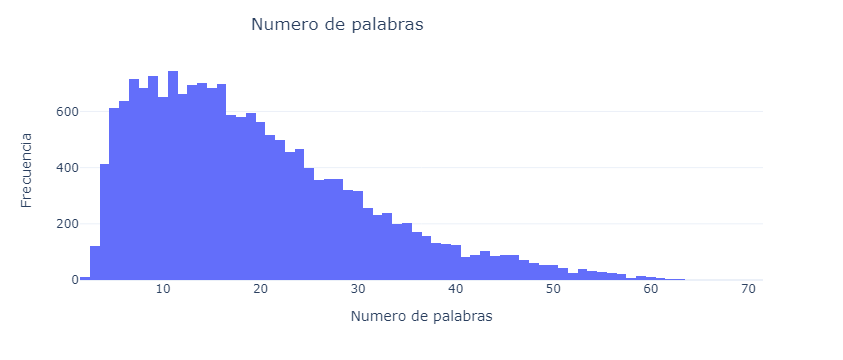

In [28]:
fig = px.histogram(
    x=lista_len_text,
    template='plotly_white'
)
fig.update_layout(
    title={
        'text': "Numero de palabras",
        'x': 0.4,
        'xanchor': 'center'
    })
fig.update_yaxes(title='Frecuencia').update_xaxes(
    title='Numero de palabras')
fig.update_layout(showlegend=False)
fig.update_layout(hovermode='x')
fig.show()

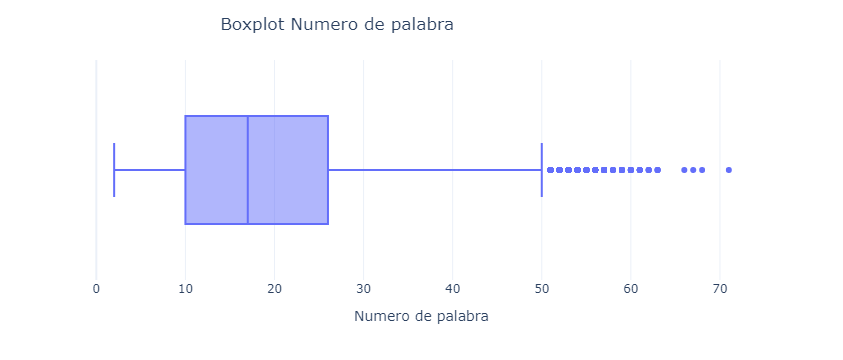

In [29]:
fig = px.box(
    x=lista_len_text,
    template='plotly_white'
)
fig.update_layout(
    title={
        'text': "Boxplot Numero de palabra",
        'x': 0.4,
        'xanchor': 'center'
    })
fig.update_xaxes(
    title='Numero de palabra')
fig.update_layout(showlegend=False)
fig.update_layout(hovermode='x')
fig.show()

In [97]:
tamañoVector = 300
w2v_model = word2vec.Word2Vec(
    tokenEntrenameintoCaracteristica,
    vector_size=tamañoVector,  
    window=20,
    min_count=1,
    sg=1  
)
w2v_model

In [98]:
len(w2v_model.wv)

20626

In [99]:
w2v_model.wv.most_similar('amoroso', topn=10)

[('misericordioso', 0.9735151529312134),
 ('confie', 0.9702177047729492),
 ('funcione', 0.9693217277526855),
 ('adoro', 0.969168484210968),
 ('romper', 0.9676343202590942),
 ('significado', 0.967315673828125),
 ('innecesario', 0.9672956466674805),
 ('devoto', 0.9666054844856262),
 ('humana', 0.966102659702301),
 ('cristo', 0.9653381109237671)]

In [100]:

# bandera Capa incrustadora
tamañoVocab = len(w2v_model.wv)
max_seq_len = 20

vocab = w2v_model.wv.key_to_index.keys()
embedding_matrix = w2v_model.wv[vocab]

In [101]:
tamañoVocab, tamañoVector, max_seq_len

(20626, 300, 20)

In [102]:
listadoVocablo = list(w2v_model.wv.key_to_index.keys())

In [103]:
def remover_OOV(muestra: list, listadoVocablo):
    in_vocab_sample = []
    for each_token in muestra:
        if each_token in listadoVocablo:
            in_vocab_sample.append(each_token)
    return in_vocab_sample

In [104]:
tokenPruebaCaracteristica = [remover_OOV(y, listadoVocablo) for y in tokenPruebaCaracteristica]

In [105]:
def w2v_indexed_token_sequences(w2v_model, list_features):
    indexed_features = []
    for each_seq in list_features:
        list_token_indices = []
        for each_token in each_seq:
            try:
                list_token_indices.append(w2v_model.wv.key_to_index[each_token])
            except KeyError as e:
                continue
        indexed_features.append(list_token_indices)
    return indexed_features

In [106]:
indiceEntrenameintoCaracteristica = w2v_indexed_token_sequences(w2v_model, tokenEntrenameintoCaracteristica)

indicePruebaCaracteristica = w2v_indexed_token_sequences(w2v_model, tokenPruebaCaracteristica)

len(indiceEntrenameintoCaracteristica), len(indicePruebaCaracteristica)

(18000, 2000)

In [107]:
padded_entrenamiento = pad_sequences(indiceEntrenameintoCaracteristica, padding = 'post', maxlen=max_seq_len, truncating='post')
padded_prueba = pad_sequences(indicePruebaCaracteristica, padding = 'post', maxlen=max_seq_len, truncating='post')

In [108]:
padded_entrenamiento

array([[  10,    2,   89, ...,    0,    0,    0],
       [  43,  263,    1, ...,   17, 1032,    4],
       [  24, 5140,   12, ...,    0,    0,    0],
       ...,
       [   3,    0,   55, ...,    0,    0,    0],
       [   2,    3,   25, ...,    0,    0,    0],
       [   2,    3,  243, ...,    6,   22,  294]], dtype=int32)

In [125]:
def obtenerModelo():
    model = Sequential()
    model.add(
        Embedding(input_dim=tamañoVocab,
                  output_dim=tamañoVector,
                  weights=[embedding_matrix],
                  input_length=max_seq_len))
    model.add(Dropout(0.8))
    model.add(LSTM(max_seq_len,return_sequences=True))
    model.add(LSTM(45))
    model.add(Dense(15))
    model.add(Dense(6,activation='softmax'))
    return model


callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss",
                                  patience=2,
                                  verbose=1,
                                  restore_best_weights=True),
    keras.callbacks.ModelCheckpoint(filepath='work/sent_w2v.h5',
                                    verbose=1,
                                    save_best_only=True)
]

In [126]:
model = obtenerModelo()
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, 20, 300)           6187800   
                                                                 
 dropout_9 (Dropout)         (None, 20, 300)           0         
                                                                 
 lstm_18 (LSTM)              (None, 20, 20)            25680     
                                                                 
 lstm_19 (LSTM)              (None, 45)                11880     
                                                                 
 dense_8 (Dense)             (None, 15)                690       
                                                                 
 dense_9 (Dense)             (None, 6)                 96        
                                                                 
Total params: 6,226,146
Trainable params: 6,226,146
No

In [127]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [128]:
tf.config.run_functions_eagerly(True)
history = model.fit(padded_entrenamiento, 
                    entrenamientoEtiquetas,
                    validation_split=0.33,
                    callbacks=callbacks,
                    epochs=10)

Epoch 1/10


/opt/conda/lib/python3.7/site-packages/tensorflow/python/data/ops/structured_function.py:265: UserWarning:

Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.



377/377 [==============================] - ETA: 0s - loss: 1.5752 - accuracy: 0.3365
Epoch 1: val_loss improved from inf to 1.48065, saving model to work/sent_w2v.h5
377/377 [==============================] - 67s 178ms/step - loss: 1.5752 - accuracy: 0.3365 - val_loss: 1.4806 - val_accuracy: 0.4489
Epoch 2/10
377/377 [==============================] - ETA: 0s - loss: 1.3200 - accuracy: 0.4956
Epoch 2: val_loss improved from 1.48065 to 1.03554, saving model to work/sent_w2v.h5
377/377 [==============================] - 67s 177ms/step - loss: 1.3200 - accuracy: 0.4956 - val_loss: 1.0355 - val_accuracy: 0.6194
Epoch 3/10
377/377 [==============================] - ETA: 0s - loss: 0.9074 - accuracy: 0.6688
Epoch 3: val_loss improved from 1.03554 to 0.82884, saving model to work/sent_w2v.h5
377/377 [==============================] - 66s 176ms/step - loss: 0.9074 - accuracy: 0.6688 - val_loss: 0.8288 - val_accuracy: 0.7110
Epoch 4/10
377/377 [==============================] - ETA: 0s - loss: 

/opt/conda/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:40: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




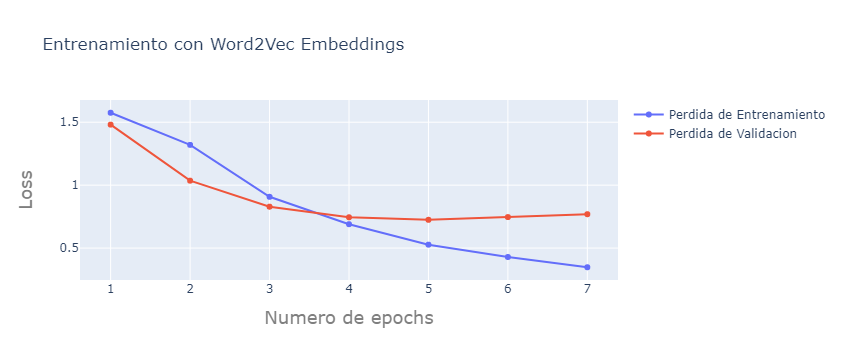

In [129]:
epochs = list(range(1, max(history.epoch) + 2))
perdidaEntrenamiento = history.history["loss"]
perdidaValidacion = history.history["val_" + "loss"]

trace1 = {
    "mode": "lines+markers",
    "name": "Perdida de Entrenamiento",
    "type": "scatter",
    "x": epochs,
    "y": perdidaEntrenamiento
}

trace2 = {
    "mode": "lines+markers",
    "name": "Perdida de Validacion",
    "type": "scatter",
    "x": epochs,
    "y": perdidaValidacion
}

data = Data([trace1, trace2])
layout = {
    "title": "Entrenamiento con Word2Vec Embeddings",
    "xaxis": {
        "title": "Numero de epochs",
        "titlefont": {
            "size": 18,
            "color": "#7f7f7f"
        }
    },
    "yaxis": {
        "title": "Loss",
        "titlefont": {
            "size": 18,
            "color": "#7f7f7f"
        }
    }
}
fig = Figure(data=data, layout=layout)
fig.update_layout(hovermode="x unified")
fig.show()

In [130]:
model_with_no_w2v = keras.models.load_model('work/sent_w2v.h5')

In [131]:
y_pred_one_hot_encoded = (model_with_no_w2v.predict(padded_prueba)> 0.5).astype("int32")
y_pred_one_hot_encoded

decodificar(y_pred_one_hot_encoded)

['tristeza',
 'tristeza',
 'amor',
 'enfado',
 'alegria',
 'alegria',
 'alegria',
 'alegria',
 'alegria',
 'tristeza',
 'enfado',
 'alegria',
 'alegria',
 'tristeza',
 'tristeza',
 'alegria',
 'alegria',
 'tristeza',
 'amor',
 'alegria',
 'miedo',
 'alegria',
 'alegria',
 'tristeza',
 'tristeza',
 'alegria',
 'alegria',
 'amor',
 'tristeza',
 'tristeza',
 'alegria',
 'tristeza',
 'alegria',
 'tristeza',
 'tristeza',
 'amor',
 'tristeza',
 'tristeza',
 'enfado',
 'alegria',
 'alegria',
 'tristeza',
 'tristeza',
 'tristeza',
 'tristeza',
 'enfado',
 'tristeza',
 'enfado',
 'alegria',
 'alegria',
 'tristeza',
 'alegria',
 'alegria',
 'tristeza',
 'alegria',
 'alegria',
 'tristeza',
 'tristeza',
 'tristeza',
 'alegria',
 'alegria',
 'alegria',
 'tristeza',
 'alegria',
 'tristeza',
 'tristeza',
 'tristeza',
 'alegria',
 'sorpresa',
 'tristeza',
 'alegria',
 'alegria',
 'tristeza',
 'miedo',
 'amor',
 'alegria',
 'alegria',
 'enfado',
 'tristeza',
 'tristeza',
 'tristeza',
 'alegria',
 'enfa

In [132]:
from sklearn.metrics import classification_report, confusion_matrix
y_pred = np.array(tf.argmax(y_pred_one_hot_encoded, axis=1))
print(classification_report(prueba['sentimiento_label'], y_pred))

              precision    recall  f1-score   support

           0       0.68      0.90      0.77       704
           1       0.75      0.38      0.50       178
           2       0.87      0.64      0.74       275
           3       0.87      0.64      0.74       212
           4       0.77      0.53      0.63        81
           5       0.80      0.82      0.81       550

    accuracy                           0.75      2000
   macro avg       0.79      0.65      0.70      2000
weighted avg       0.77      0.75      0.74      2000



In [133]:
pruebas2 = [
    'me siento tan inutil durante esos momentos que estaba luchando para encontrar trabajo'
    ,'me siento feliz'
    ,'me siento nervioso, no se que pasara mañana en mi trabajo'
    , 'me siento mal, creo que la ame demasiado'
    ]


mipruebaToken = [toktok.tokenize(y) for y in pruebas2]
itk = w2v_indexed_token_sequences(w2v_model, mipruebaToken)

pruebasol = pad_sequences(itk, padding = 'post', maxlen=max_seq_len, truncating='post')

pprueba = (model_with_no_w2v.predict(pruebasol)> 0.5).astype("int32")
pp = decodificar(pprueba)

pp


/opt/conda/lib/python3.7/site-packages/tensorflow/python/data/ops/structured_function.py:265: UserWarning:

Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.



['tristeza', 'alegria', 'miedo', 'tristeza']